Rudraksh Singh Lab 11

In [3]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
import networkx as nx
from google.colab.patches import cv2_imshow

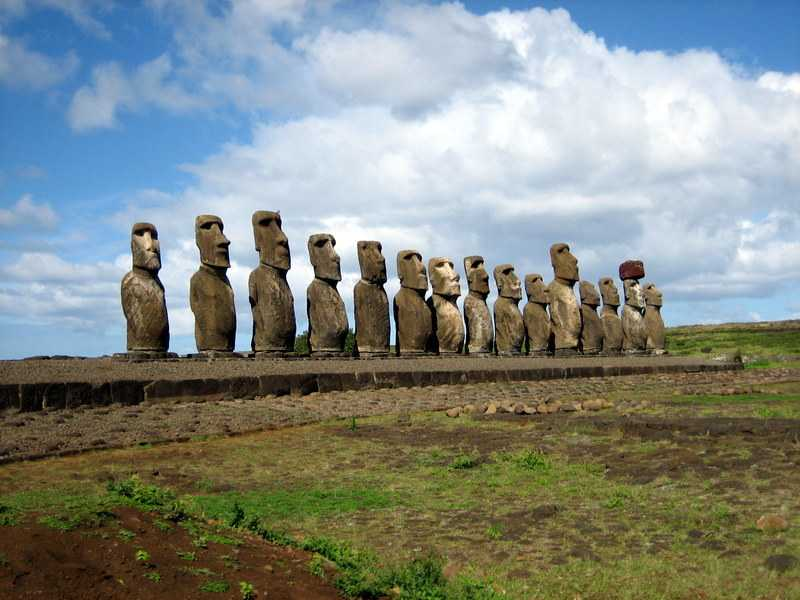

In [4]:
# Upload or load from URL
image_path = '/content/compressed_lossy.jpg'
video_path = '/content/That One Christopher Nolan Edit.mp4'

image = cv2.imread(image_path)
video = cv2.VideoCapture(video_path)

cv2_imshow(image)


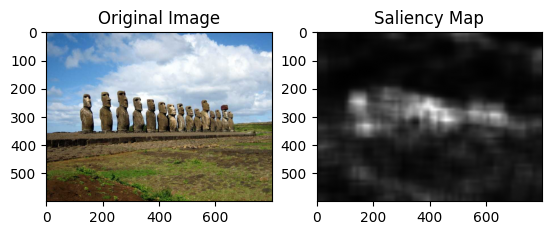

In [5]:
saliency = cv2.saliency.StaticSaliencySpectralResidual_create()

(success, saliencyMap) = saliency.computeSaliency(image)
saliencyMap = (saliencyMap * 255).astype("uint8")

plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.title("Original Image")
plt.subplot(1, 2, 2)
plt.imshow(saliencyMap, cmap='gray')
plt.title("Saliency Map")
plt.show()


Frame 0


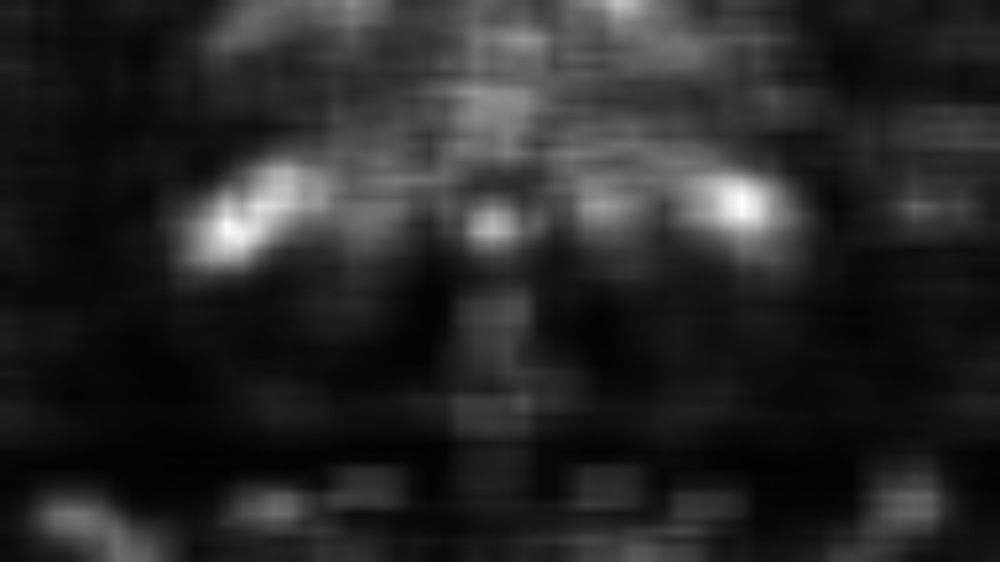

Frame 1


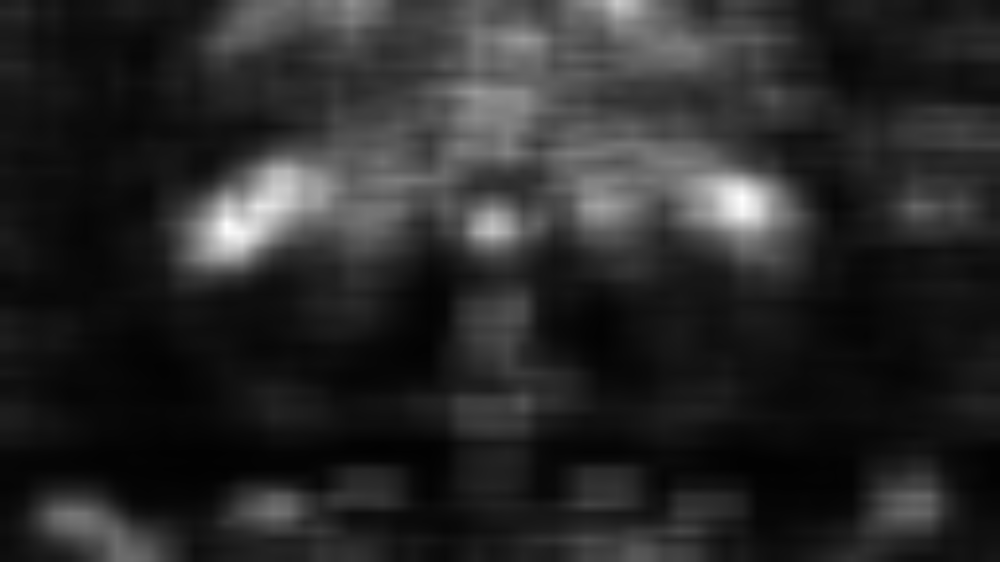

Frame 2


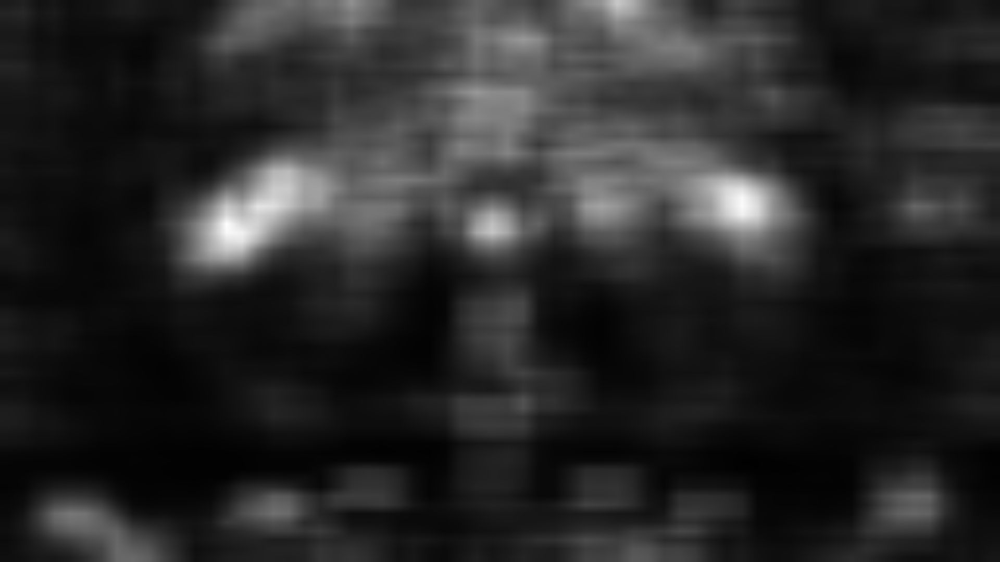

Frame 3


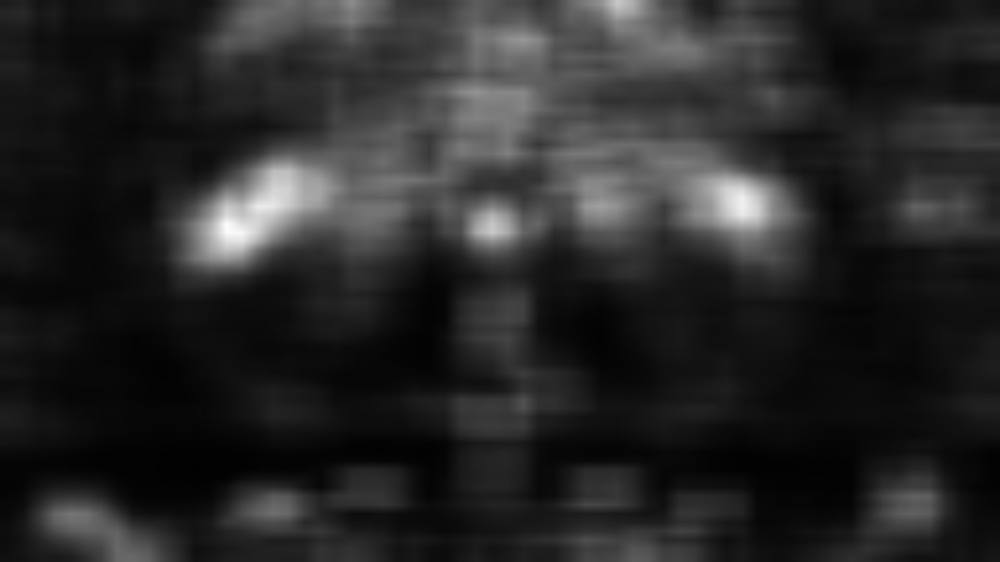

Frame 4


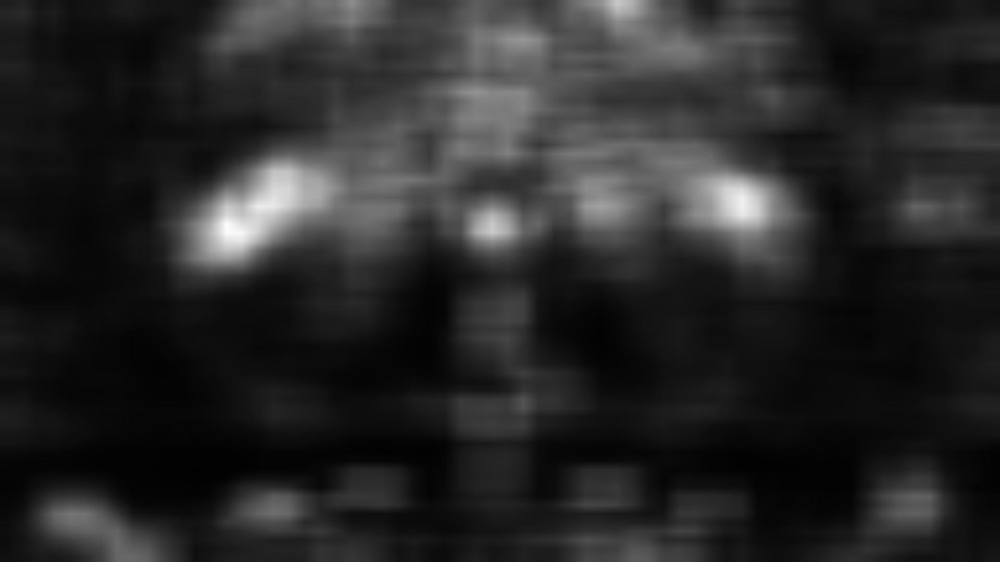

Frame 5


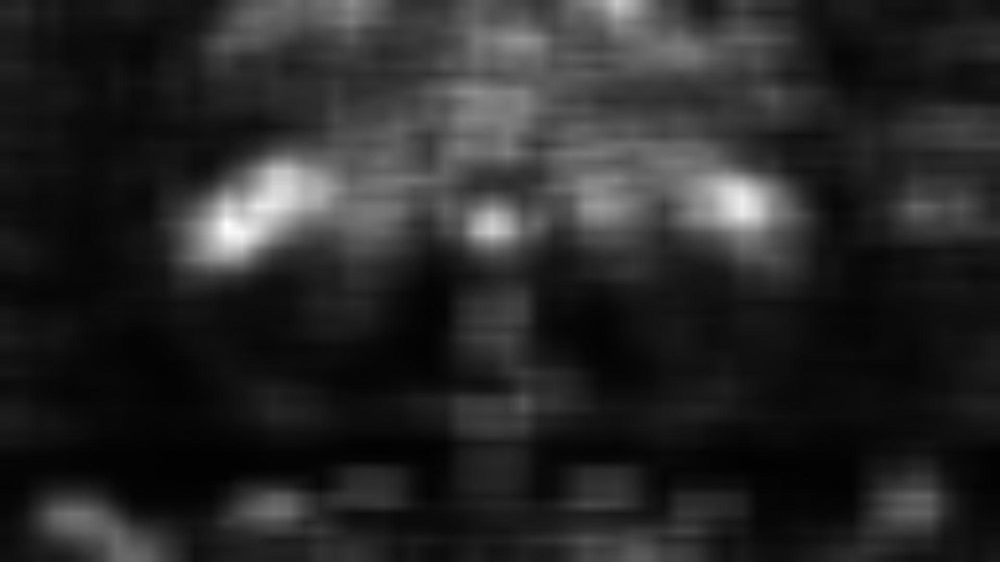

Frame 6


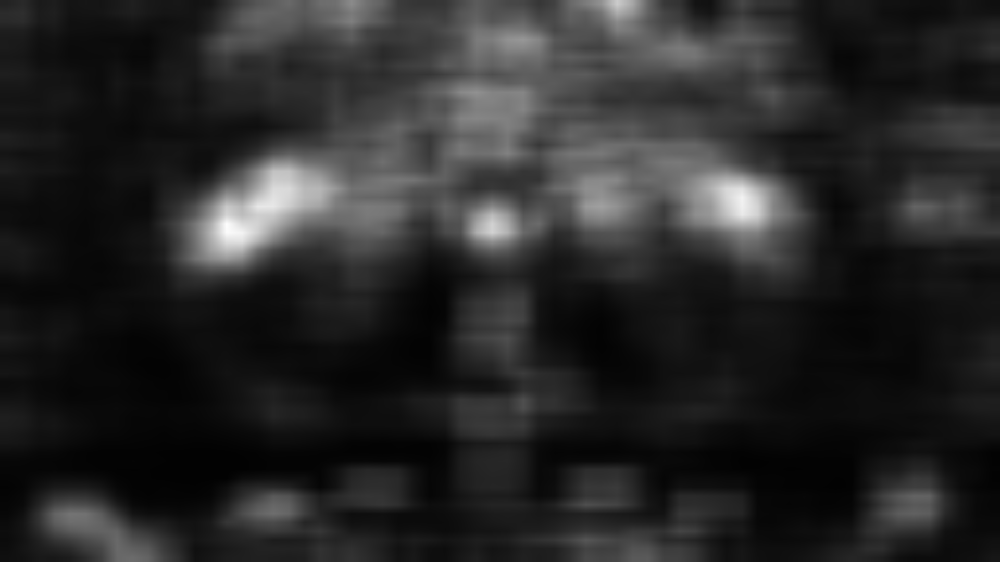

Frame 7


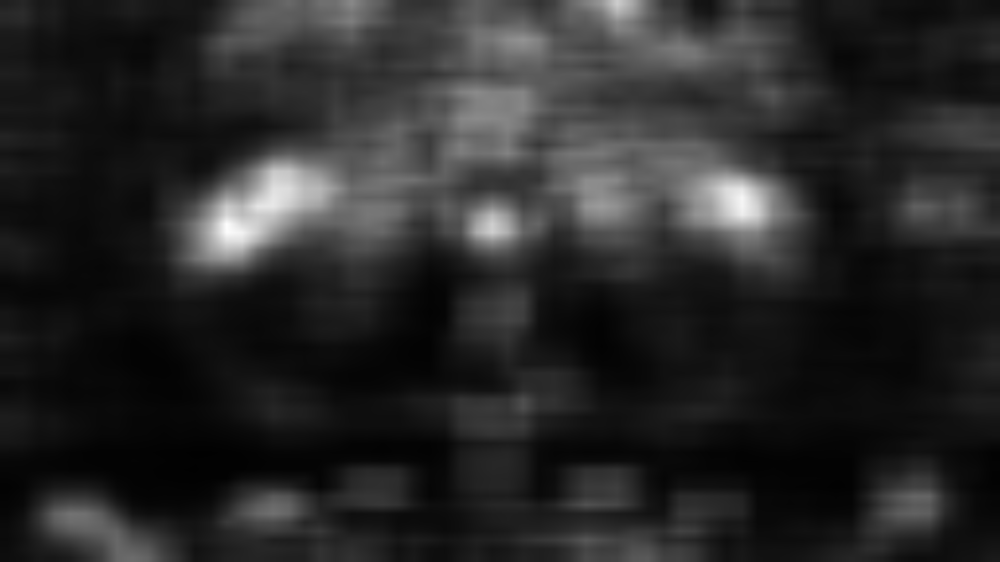

Frame 8


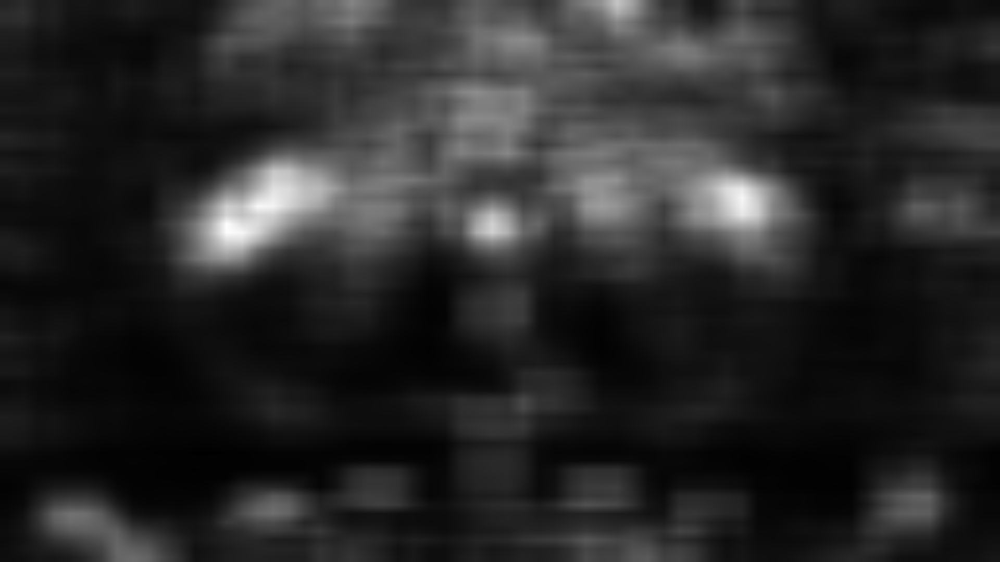

Frame 9


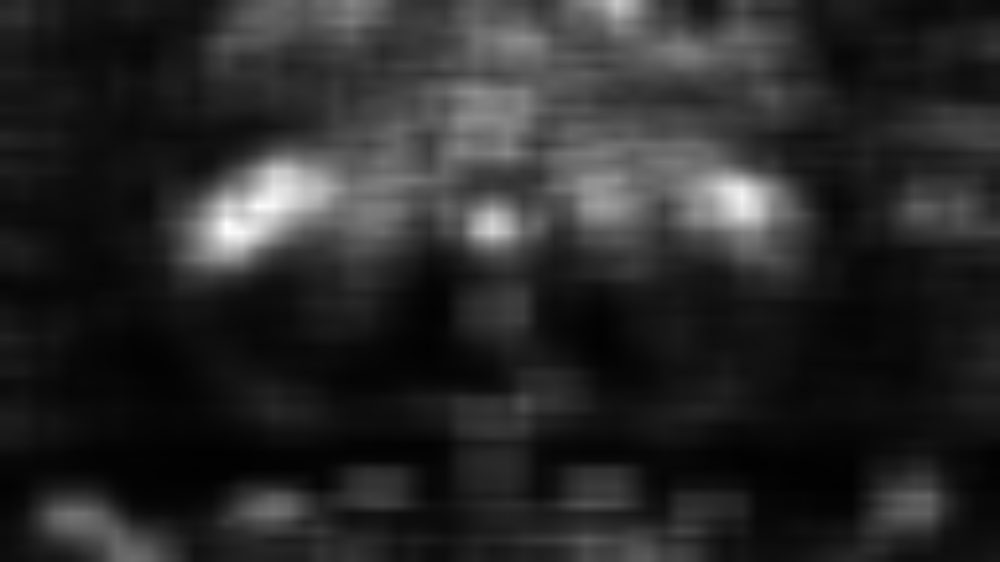

Frame 10


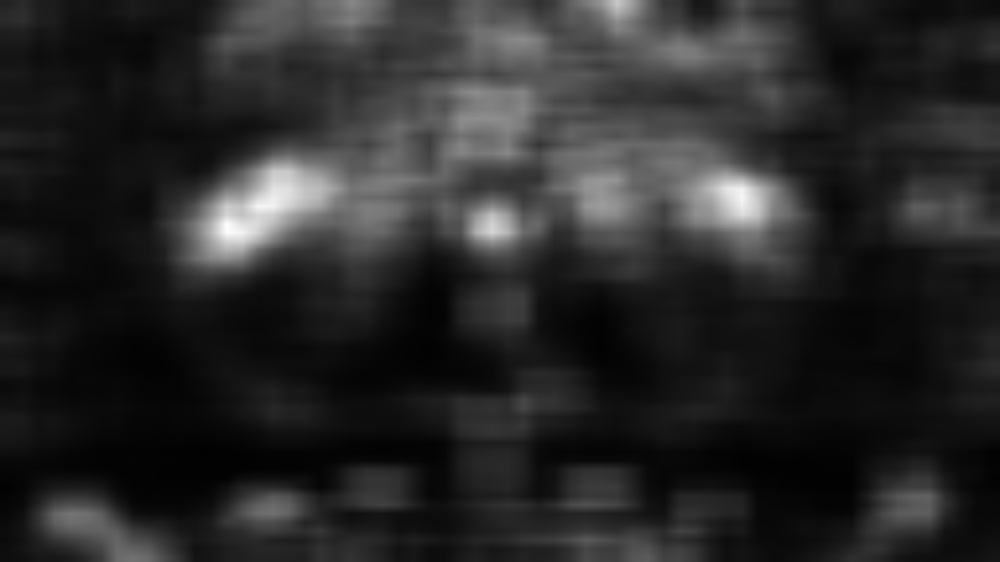

In [6]:
frame_count = 0

while True:
    ret, frame = video.read()
    if not ret or frame_count > 10:
        break

    success, saliencyMap = saliency.computeSaliency(frame)
    saliencyMap = (saliencyMap * 255).astype("uint8")

    print(f"Frame {frame_count}")
    cv2_imshow(saliencyMap)

    frame_count += 1

video.release()

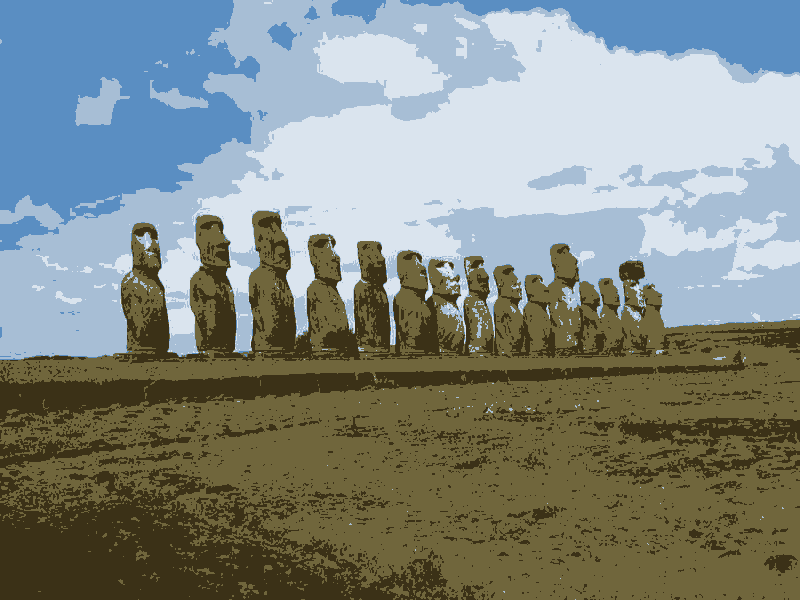

In [7]:
landscape = cv2.imread(image_path)
Z = landscape.reshape((-1, 3))
Z = np.float32(Z)

K = 5
criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 10, 1.0)
_, label, center = cv2.kmeans(Z, K, None, criteria, 10, cv2.KMEANS_RANDOM_CENTERS)
center = np.uint8(center)
res = center[label.flatten()]
segmented_image = res.reshape((landscape.shape))

cv2_imshow(segmented_image)

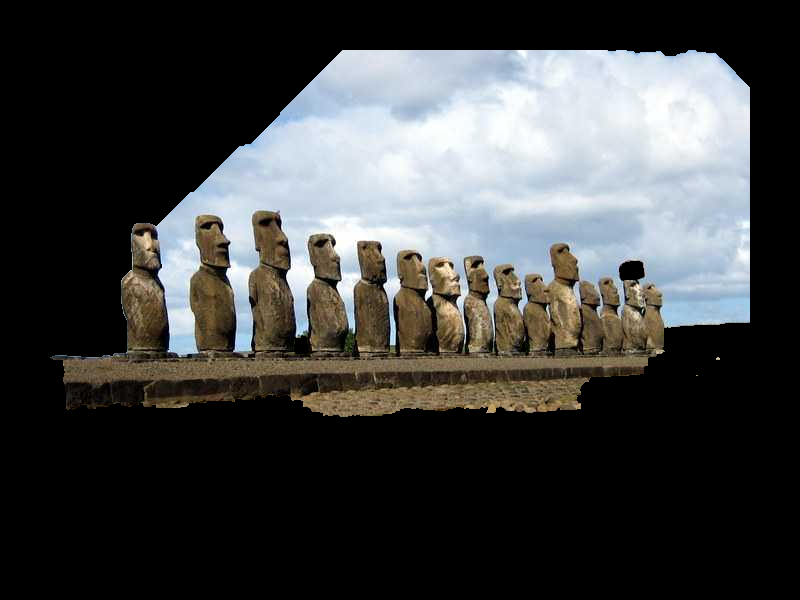

In [8]:
from matplotlib import pyplot as plt

img = cv2.imread(image_path)
mask = np.zeros(img.shape[:2], np.uint8)

bgdModel = np.zeros((1,65), np.float64)
fgdModel = np.zeros((1,65), np.float64)

rect = (50, 50, img.shape[1]-100, img.shape[0]-100) # (x, y, w, h)
cv2.grabCut(img, mask, rect, bgdModel, fgdModel, 5, cv2.GC_INIT_WITH_RECT)

mask2 = np.where((mask==2)|(mask==0), 0, 1).astype('uint8')
img_cut = img * mask2[:, :, np.newaxis]

cv2_imshow(img_cut)

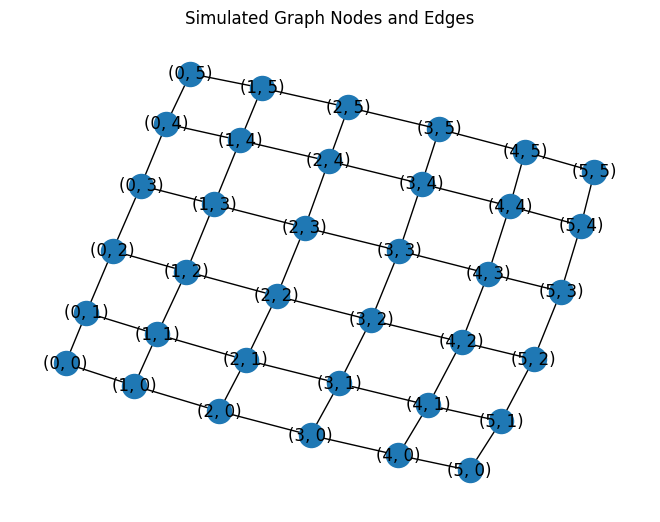

In [9]:
import networkx as nx
G = nx.grid_2d_graph(6, 6)  # Simulated example
nx.draw(G, with_labels=True)
plt.title("Simulated Graph Nodes and Edges")
plt.show()

In [26]:
from google.colab import files
files.upload()

!mkdir -p ~/.kaggle
!mv kaggle.json ~/.kaggle/
!chmod 600 ~/.kaggle/kaggle.json

Saving kaggle.json to kaggle.json


In [27]:
import kagglehub
path = kagglehub.dataset_download("pevogam/ucf101")
print("Path to dataset files:", path)

Path to dataset files: /kaggle/input/ucf101


In [28]:
import os
dataset_path = '/kaggle/input/ucf101/UCF101'
for root, dirs, files in os.walk(dataset_path):
    print("📁", root)
    for d in dirs:
        print(" ┣━", d)
    for f in files[:5]:
        print(" ┗━", f)
    break

📁 /kaggle/input/ucf101/UCF101
 ┣━ UCF-101


In [29]:
import cv2
import os
import numpy as np

def extract_frames(video_path, output_path, size=(64, 64), max_frames=32):
    cap = cv2.VideoCapture(video_path)
    frames = []
    count = 0

    while cap.isOpened() and count < max_frames:
        ret, frame = cap.read()
        if not ret:
            break
        frame = cv2.resize(frame, size)
        frame = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
        frames.append(frame)
        count += 1

    cap.release()
    frames = np.array(frames, dtype=np.float32) / 255.0

    os.makedirs(os.path.dirname(output_path), exist_ok=True)
    np.save(output_path, frames)
    print(f"✅ Saved: {output_path}")

base_path = "/kaggle/input/ucf101/UCF101/UCF-101"
output_base = "/kaggle/working/processed_videos"

classes = ["JumpingJack", "PushUps"]

for cls in classes:
    cls_path = os.path.join(base_path, cls)
    videos = sorted(os.listdir(cls_path))[:5]
    for vid in videos:
        input_video = os.path.join(cls_path, vid)
        output_npy = os.path.join(output_base, cls, vid.replace(".avi", ".npy"))
        extract_frames(input_video, output_npy)

✅ Saved: /kaggle/working/processed_videos/JumpingJack/v_JumpingJack_g01_c01.npy
✅ Saved: /kaggle/working/processed_videos/JumpingJack/v_JumpingJack_g01_c02.npy
✅ Saved: /kaggle/working/processed_videos/JumpingJack/v_JumpingJack_g01_c03.npy
✅ Saved: /kaggle/working/processed_videos/JumpingJack/v_JumpingJack_g01_c04.npy
✅ Saved: /kaggle/working/processed_videos/JumpingJack/v_JumpingJack_g01_c05.npy
✅ Saved: /kaggle/working/processed_videos/PushUps/v_PushUps_g01_c01.npy
✅ Saved: /kaggle/working/processed_videos/PushUps/v_PushUps_g01_c02.npy
✅ Saved: /kaggle/working/processed_videos/PushUps/v_PushUps_g01_c03.npy
✅ Saved: /kaggle/working/processed_videos/PushUps/v_PushUps_g01_c04.npy
✅ Saved: /kaggle/working/processed_videos/PushUps/v_PushUps_g01_c05.npy


In [30]:
import tensorflow as tf
from tensorflow.keras import layers, models

latent_dim = 100
video_shape = (32, 64, 64, 3)

def build_generator():
    model = models.Sequential()
    model.add(layers.Input(shape=(latent_dim,)))

    model.add(layers.Dense(4*8*8*512))
    model.add(layers.Reshape((4, 8, 8, 512)))

    model.add(layers.Conv3DTranspose(256, (4,4,4), strides=(2,2,2), padding='same', activation='relu'))
    model.add(layers.Conv3DTranspose(128, (4,4,4), strides=(2,2,2), padding='same', activation='relu'))
    model.add(layers.Conv3DTranspose(64, (4,4,4), strides=(2,2,2), padding='same', activation='relu'))
    model.add(layers.Conv3DTranspose(3, (3,3,3), activation='sigmoid', padding='same'))

    return model

def build_discriminator():
    model = models.Sequential()
    model.add(layers.Conv3D(64, kernel_size=4, strides=2, padding='same', input_shape=video_shape))
    model.add(layers.LeakyReLU(0.2))
    model.add(layers.Conv3D(128, kernel_size=4, strides=2, padding='same'))
    model.add(layers.LeakyReLU(0.2))
    model.add(layers.Conv3D(256, kernel_size=4, strides=2, padding='same'))
    model.add(layers.LeakyReLU(0.2))
    model.add(layers.Flatten())
    model.add(layers.Dense(1, activation='sigmoid'))
    return model



In [31]:
generator = build_generator()
discriminator = build_discriminator()

noise = tf.random.normal([1, latent_dim])
generated_video = generator(noise)
print("Generated video shape:", generated_video.shape)

decision = discriminator(generated_video)
print("Discriminator output:", decision.shape)

Generated video shape: (1, 32, 64, 64, 3)
Discriminator output: (1, 1)


In [32]:
import glob

def load_dataset(path):
    npy_files = glob.glob(os.path.join(path, '**', '*.npy'), recursive=True)
    data = [np.load(f) for f in npy_files]
    data = [d if d.shape[0] == 32 else np.pad(d, ((0, 32 - d.shape[0]), (0,0), (0,0), (0,0)), mode='constant') for d in data]
    return np.array(data)

videos = load_dataset('/kaggle/working/processed_videos')
print("Loaded videos:", videos.shape)

batch_size = 2
dataset = tf.data.Dataset.from_tensor_slices(videos).shuffle(buffer_size=10).batch(batch_size)

Loaded videos: (10, 32, 64, 64, 3)


In [33]:


generator = build_generator()
discriminator = build_discriminator()

cross_entropy = tf.keras.losses.BinaryCrossentropy()

def discriminator_loss(real_output, fake_output):
    return cross_entropy(tf.ones_like(real_output), real_output) + \
           cross_entropy(tf.zeros_like(fake_output), fake_output)

def generator_loss(fake_output):
    return cross_entropy(tf.ones_like(fake_output), fake_output)

gen_optimizer = tf.keras.optimizers.Adam(1e-4)
disc_optimizer = tf.keras.optimizers.Adam(1e-4)

@tf.function
def train_step(real_videos):
    noise = tf.random.normal([batch_size, latent_dim])

    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
        generated_videos = generator(noise, training=True)

        real_output = discriminator(real_videos, training=True)
        fake_output = discriminator(generated_videos, training=True)

        gen_loss = generator_loss(fake_output)
        disc_loss = discriminator_loss(real_output, fake_output)

    gradients_of_gen = gen_tape.gradient(gen_loss, generator.trainable_variables)
    gradients_of_disc = disc_tape.gradient(disc_loss, discriminator.trainable_variables)

    gen_optimizer.apply_gradients(zip(gradients_of_gen, generator.trainable_variables))
    disc_optimizer.apply_gradients(zip(gradients_of_disc, discriminator.trainable_variables))

    return gen_loss, disc_loss

In [37]:
# Training Loop
import time
epochs = 100

for epoch in range(epochs):
    start = time.time()
    for video_batch in dataset:
        g_loss, d_loss = train_step(video_batch)
    print(f"Epoch {epoch+1}, Gen Loss: {g_loss:.4f}, Disc Loss: {d_loss:.4f}, Time: {time.time() - start:.2f}s")

Epoch 1, Gen Loss: 4.8911, Disc Loss: 0.0113, Time: 0.63s
Epoch 2, Gen Loss: 1.9729, Disc Loss: 0.2306, Time: 0.58s
Epoch 3, Gen Loss: 7.8700, Disc Loss: 0.0004, Time: 0.57s
Epoch 4, Gen Loss: 10.9725, Disc Loss: 0.0002, Time: 0.58s
Epoch 5, Gen Loss: 5.0210, Disc Loss: 0.0093, Time: 0.57s
Epoch 6, Gen Loss: 4.6751, Disc Loss: 0.0101, Time: 0.58s
Epoch 7, Gen Loss: 4.3143, Disc Loss: 0.0429, Time: 0.58s
Epoch 8, Gen Loss: 6.4027, Disc Loss: 0.0138, Time: 0.58s
Epoch 9, Gen Loss: 10.1337, Disc Loss: 0.0078, Time: 0.58s
Epoch 10, Gen Loss: 9.7642, Disc Loss: 0.0032, Time: 0.58s
Epoch 11, Gen Loss: 10.1099, Disc Loss: 0.0030, Time: 0.59s
Epoch 12, Gen Loss: 6.6119, Disc Loss: 0.0082, Time: 0.58s
Epoch 13, Gen Loss: 5.6206, Disc Loss: 0.0073, Time: 0.62s
Epoch 14, Gen Loss: 5.7762, Disc Loss: 0.0321, Time: 0.57s
Epoch 15, Gen Loss: 5.8941, Disc Loss: 0.0057, Time: 0.58s
Epoch 16, Gen Loss: 6.2556, Disc Loss: 0.0445, Time: 0.58s
Epoch 17, Gen Loss: 4.2777, Disc Loss: 0.0232, Time: 0.59s
Epo

In [38]:
def save_generated_video(generated_frames, output_filename='generated_video.avi'):
    out = cv2.VideoWriter(output_filename, cv2.VideoWriter_fourcc(*'XVID'), 25, (64, 64))
    for frame in generated_frames:
        out.write(cv2.cvtColor(frame, cv2.COLOR_RGB2BGR))
    out.release()
    print(f"Generated video saved as {output_filename}")

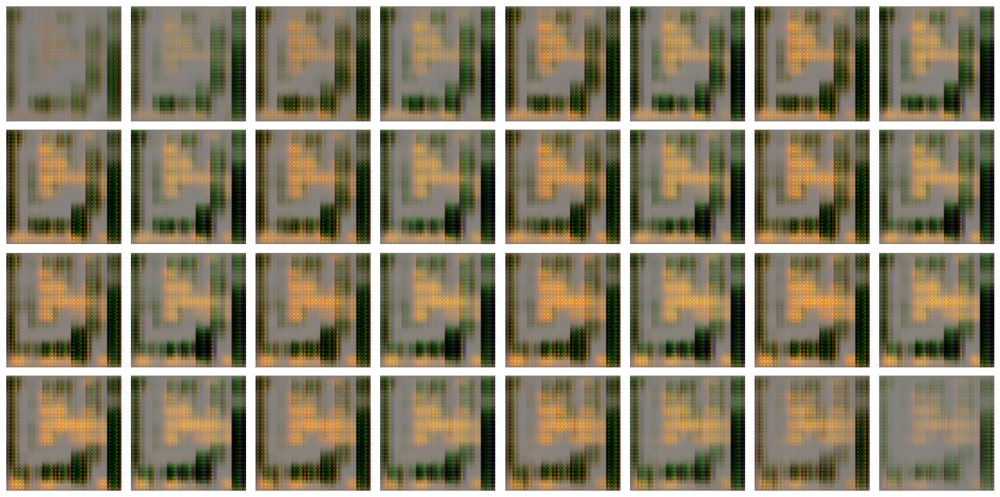

In [39]:
import matplotlib.pyplot as plt

def show_generated_video():
    noise = tf.random.normal([1, latent_dim])
    generated = generator(noise, training=False).numpy()[0]

    fig, axes = plt.subplots(4, 8, figsize=(16, 8))
    for i, ax in enumerate(axes.flat):
        ax.imshow(generated[i])
        ax.axis('off')
    plt.tight_layout()
    plt.show()

show_generated_video()